In [1]:


import warnings, os
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.inspection import permutation_importance
import xgboost as xgb
import lightgbm as lgb
import shap

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from prophet import Prophet

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (LSTM, Dense, Dropout, Input,
                                     MultiHeadAttention, LayerNormalization,
                                     GlobalAveragePooling1D)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

sns.set_theme(style='darkgrid', palette='viridis')
plt.rcParams.update({'figure.dpi': 130, 'figure.figsize': (14, 5)})


In [2]:
CSV_PATH = "GlobalWeatherRepository.csv"
df_raw = pd.read_csv(CSV_PATH)
print(f"Shape: {df_raw.shape}")
df_raw.head(3)


Shape: (143262, 41)


,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,Afghanistan,Kabul,34.52,69.18,Asia/Kabul,1715849100,2024-05-16 13:15,26.6,79.8,Partly Cloudy,...,8.4,26.6,1,1,04:50 AM,06:50 PM,12:12 PM,01:11 AM,Waxing Gibbous,55
1,Albania,Tirana,41.33,19.82,Europe/Tirane,1715849100,2024-05-16 10:45,19.0,66.2,Partly cloudy,...,1.1,2.0,1,1,05:21 AM,07:54 PM,12:58 PM,02:14 AM,Waxing Gibbous,55
2,Algeria,Algiers,36.76,3.05,Africa/Algiers,1715849100,2024-05-16 09:45,23.0,73.4,Sunny,...,10.4,18.4,1,1,05:40 AM,07:50 PM,01:15 PM,02:14 AM,Waxing Gibbous,55


In [3]:
print("Columns:", df_raw.columns.tolist())
print("\nDtypes:\n", df_raw.dtypes.value_counts())
print("\nMissing values (top 20):")
print(df_raw.isnull().sum().sort_values(ascending=False).head(20))


Columns: ['country', 'location_name', 'latitude', 'longitude', 'timezone', 'last_updated_epoch', 'last_updated', 'temperature_celsius', 'temperature_fahrenheit', 'condition_text', 'wind_mph', 'wind_kph', 'wind_degree', 'wind_direction', 'pressure_mb', 'pressure_in', 'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius', 'feels_like_fahrenheit', 'visibility_km', 'visibility_miles', 'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'sunrise', 'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination']

Dtypes:
 float64    23
object     11
int64       7
Name: count, dtype: int64

Missing values (top 20):
country                   0
location_name             0
latitude                  0
longitude                 0
timezone                  0
last_updated_epoch        0
l

In [4]:
df = df_raw.copy()
df['last_updated'] = pd.to_datetime(df['last_updated'], infer_datetime_format=True)
df = df.sort_values('last_updated').reset_index(drop=True)

thresh = 0.50
missing_pct = df.isnull().mean()
drop_cols = missing_pct[missing_pct > thresh].index.tolist()
print(f"Dropping {len(drop_cols)} high-missing columns: {drop_cols}")
df.drop(columns=drop_cols, inplace=True)

num_cols = df.select_dtypes(include='number').columns.tolist()
df[num_cols] = df.groupby('country')[num_cols].transform(lambda x: x.fillna(x.median()))
df[num_cols] = df[num_cols].fillna(df[num_cols].median())   # global fallback

cat_cols = df.select_dtypes(include='object').columns.difference(['country','location_name','last_updated'])
for c in cat_cols:
    df[c].fillna(df[c].mode()[0], inplace=True)

core = ['temperature_celsius','humidity','wind_kph','pressure_mb','precip_mm','uv_index']
core = [c for c in core if c in df.columns]
for col in core:
    Q1, Q3 = df[col].quantile(0.01), df[col].quantile(0.99)
    df[col] = df[col].clip(Q1, Q3)

print(f"\nClean shape: {df.shape}")
print(f"Date range: {df['last_updated'].min()} → {df['last_updated'].max()}")
df.head(2)


Dropping 0 high-missing columns: []

Clean shape: (143262, 41)
Date range: 2024-05-16 01:45:00 → 2026-05-24 19:15:00


,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,United States of America,Washington Park,46.60,-120.49,America/Los_Angeles,1715849100,2024-05-16 01:45:00,16.1,61.0,Clear,...,6.3,7.1,1,1,05:26 AM,08:31 PM,01:36 PM,02:52 AM,Waxing Gibbous,55
1,Costa Rica,San Juan,9.97,-84.08,America/Costa_Rica,1715849100,2024-05-16 02:45:00,21.0,69.8,Fog,...,21.7,23.3,2,2,05:15 AM,05:51 PM,12:42 PM,12:37 AM,Waxing Gibbous,55


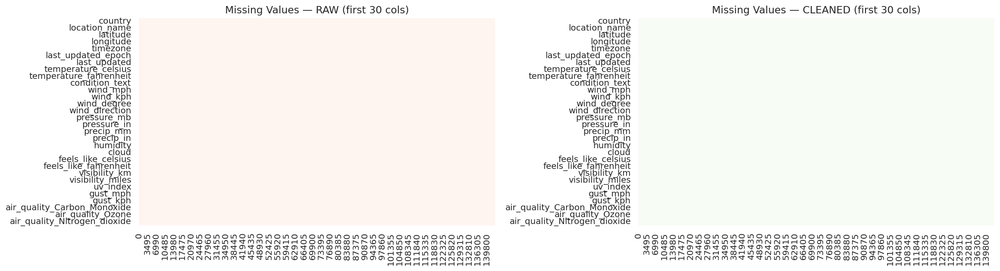

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(18, 5))

sns.heatmap(df_raw[df_raw.columns[:30]].isnull().T, cbar=False,
            cmap='Reds', ax=axes[0], yticklabels=True)
axes[0].set_title('Missing Values — RAW (first 30 cols)', fontsize=13)

sns.heatmap(df[df.columns[:30]].isnull().T, cbar=False,
            cmap='Greens', ax=axes[1], yticklabels=True)
axes[1].set_title('Missing Values — CLEANED (first 30 cols)', fontsize=13)

plt.tight_layout()
plt.savefig('missing_heatmap.png', bbox_inches='tight')
plt.show()


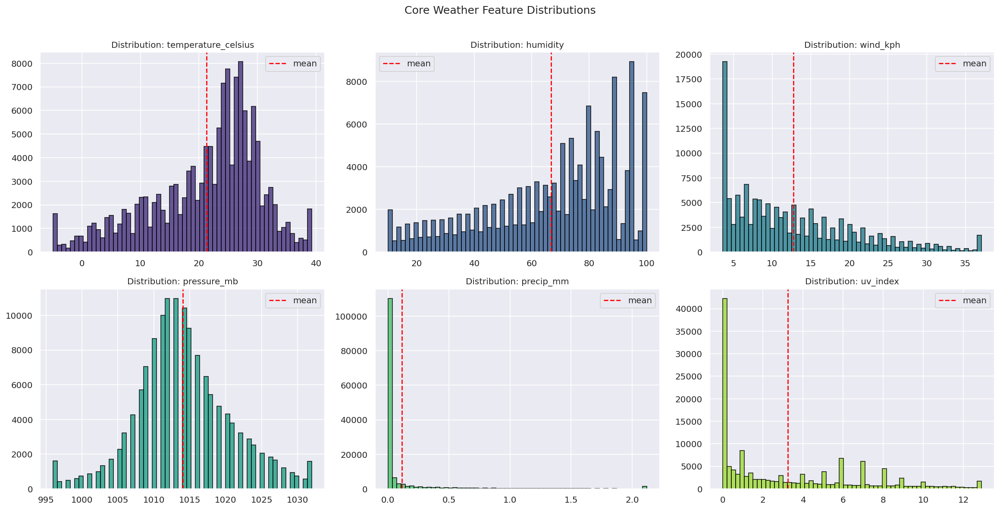

In [6]:
fig, axes = plt.subplots(2, 3, figsize=(18, 9))
axes = axes.flatten()
for i, col in enumerate(core):
    axes[i].hist(df[col].dropna(), bins=60, color=sns.color_palette('viridis',6)[i], edgecolor='k', alpha=0.8)
    axes[i].set_title(f'Distribution: {col}', fontsize=11)
    axes[i].axvline(df[col].mean(), color='red', linestyle='--', label='mean')
    axes[i].legend()
plt.suptitle('Core Weather Feature Distributions', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig('distributions.png', bbox_inches='tight')
plt.show()


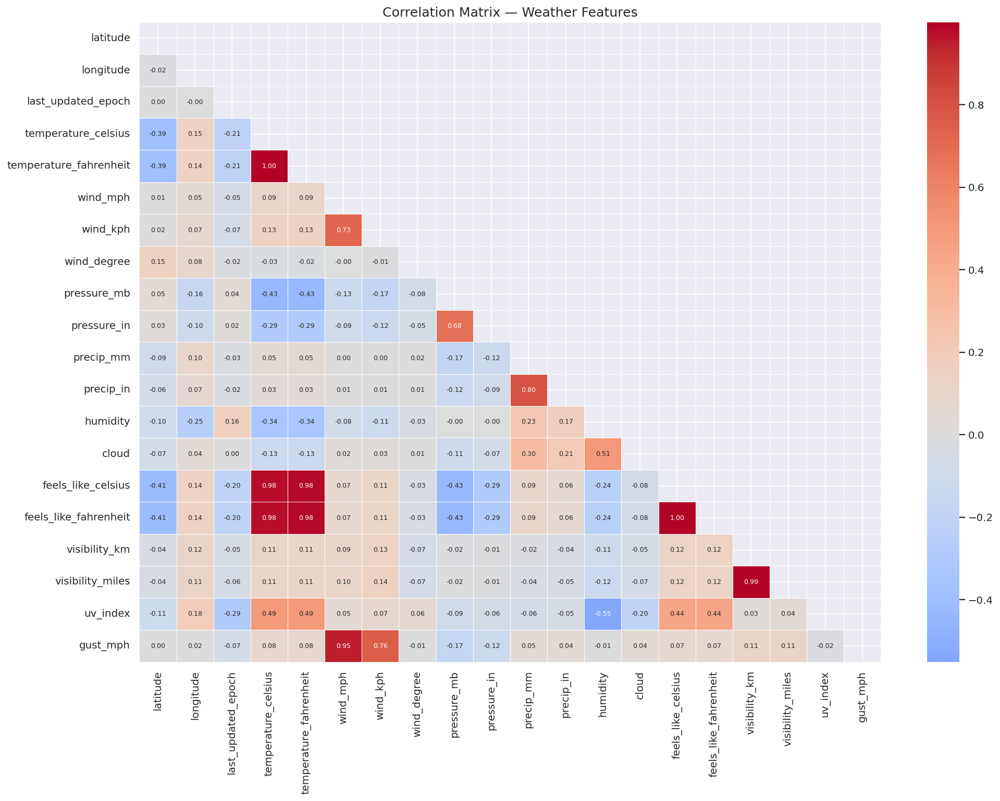

In [7]:
corr_cols = [c for c in num_cols if c in df.columns][:20]
corr = df[corr_cols].corr()

mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(16, 12))
sns.heatmap(corr, mask=mask, annot=True, fmt='.2f', cmap='coolwarm',
            center=0, linewidths=0.4, annot_kws={'size':7})
plt.title('Correlation Matrix — Weather Features', fontsize=14)
plt.tight_layout()
plt.savefig('correlation_matrix.png', bbox_inches='tight')
plt.show()


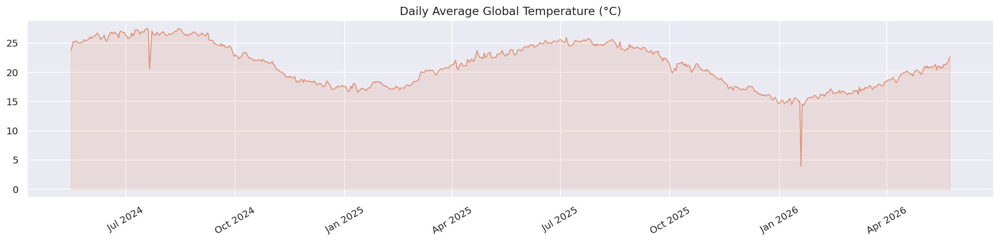

In [8]:
daily = (df.set_index('last_updated')['temperature_celsius']
           .resample('D').mean()
           .dropna())

fig, ax = plt.subplots(figsize=(16, 4))
ax.plot(daily.index, daily.values, lw=1, color='#E07B54', alpha=0.8)
ax.fill_between(daily.index, daily.values, alpha=0.15, color='#E07B54')
ax.set_title('Daily Average Global Temperature (°C)', fontsize=13)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=30)
plt.tight_layout()
plt.savefig('temp_timeseries.png', bbox_inches='tight')
plt.show()


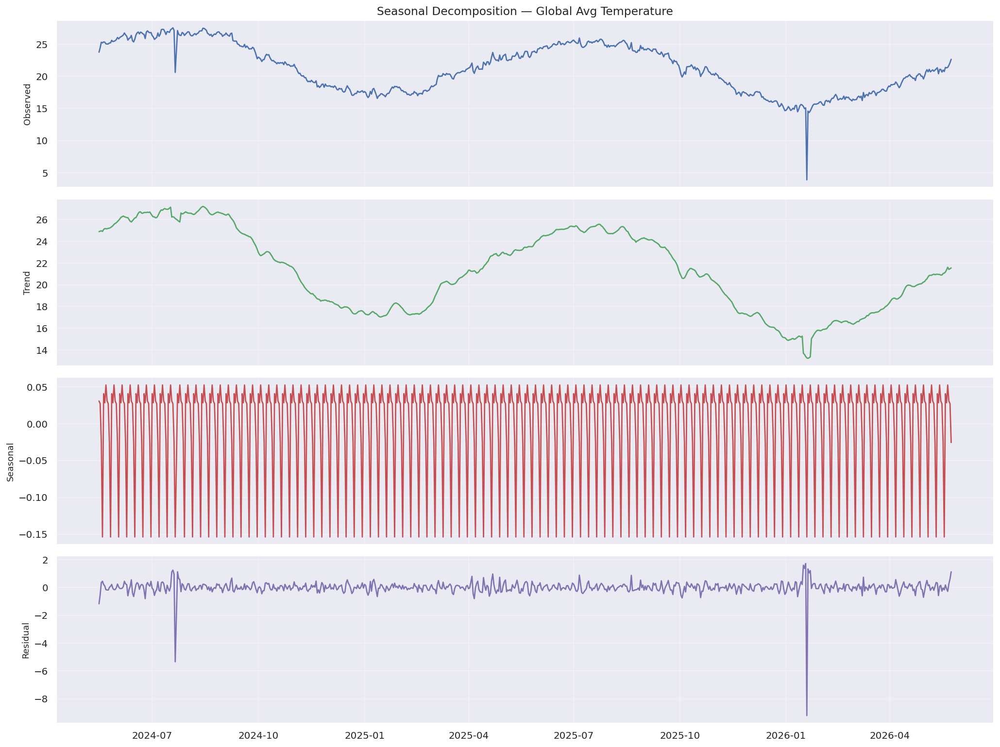

In [9]:

if len(daily) >= 14:
    decomp = seasonal_decompose(daily, model='additive', period=7, extrapolate_trend='freq')
    fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True)
    labels = ['Observed', 'Trend', 'Seasonal', 'Residual']
    series_ = [decomp.observed, decomp.trend, decomp.seasonal, decomp.resid]
    colors  = ['#4C72B0','#55A868','#C44E52','#8172B2']
    for ax, lab, s, c in zip(axes, labels, series_, colors):
        ax.plot(s, color=c, lw=1.5)
        ax.set_ylabel(lab, fontsize=10)
        ax.grid(True, alpha=0.3)
    axes[0].set_title('Seasonal Decomposition — Global Avg Temperature', fontsize=13)
    plt.tight_layout()
    plt.savefig('seasonal_decomp.png', bbox_inches='tight')
    plt.show()


In [10]:
feat_anomaly = [c for c in core if c in df.columns]
X_anom = df[feat_anomaly].dropna()
idx_anom = X_anom.index

iso = IsolationForest(contamination=0.03, random_state=42, n_jobs=-1)
labels_iso = iso.fit_predict(X_anom)
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.03, n_jobs=-1)
labels_lof = lof.fit_predict(X_anom)

df.loc[idx_anom, 'anomaly_iso'] = (labels_iso == -1).astype(int)
df.loc[idx_anom, 'anomaly_lof'] = (labels_lof == -1).astype(int)
df['anomaly_iso'] = df['anomaly_iso'].fillna(0).astype(int)
df['anomaly_lof'] = df['anomaly_lof'].fillna(0).astype(int)
df['anomaly_consensus'] = ((df['anomaly_iso'] + df['anomaly_lof']) >= 2).astype(int)

print(f"Isolation Forest anomalies : {df['anomaly_iso'].sum():,}")
print(f"Local Outlier Factor anomalies: {df['anomaly_lof'].sum():,}")
print(f"Consensus anomalies (both)  : {df['anomaly_consensus'].sum():,}")


Isolation Forest anomalies : 4,298
Local Outlier Factor anomalies: 4,298
Consensus anomalies (both)  : 610


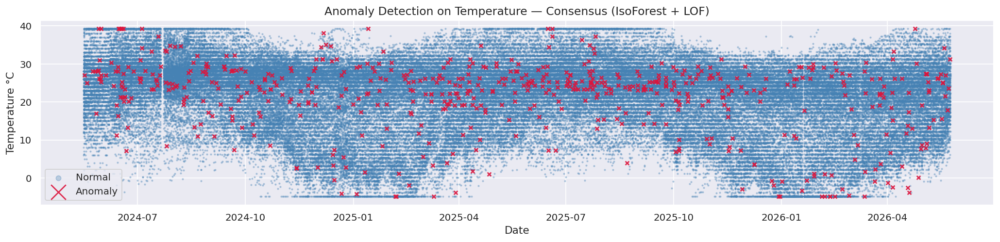

In [11]:
tmp = df[['last_updated','temperature_celsius','anomaly_consensus']].dropna()
normal = tmp[tmp['anomaly_consensus'] == 0]
anom   = tmp[tmp['anomaly_consensus'] == 1]

plt.figure(figsize=(16, 4))
plt.scatter(normal['last_updated'], normal['temperature_celsius'],
            s=2, alpha=0.3, color='steelblue', label='Normal')
plt.scatter(anom['last_updated'],   anom['temperature_celsius'],
            s=18, alpha=0.9, color='crimson', marker='x', label='Anomaly')
plt.title('Anomaly Detection on Temperature — Consensus (IsoForest + LOF)', fontsize=13)
plt.xlabel('Date'); plt.ylabel('Temperature °C')
plt.legend(markerscale=4)
plt.tight_layout()
plt.savefig('anomaly_detection.png', bbox_inches='tight')
plt.show()


In [12]:
df['year']         = df['last_updated'].dt.year
df['month']        = df['last_updated'].dt.month
df['day_of_year']  = df['last_updated'].dt.dayofyear
df['week']         = df['last_updated'].dt.isocalendar().week.astype(int)
df['season']       = df['month'].map({12:'Winter',1:'Winter',2:'Winter',
                                       3:'Spring',4:'Spring',5:'Spring',
                                       6:'Summer',7:'Summer',8:'Summer',
                                       9:'Autumn',10:'Autumn',11:'Autumn'})

df = df.sort_values(['location_name','last_updated'])
for col in ['temperature_celsius','humidity','precip_mm']:
    if col in df.columns:
        df[f'{col}_roll7']  = (df.groupby('location_name')[col]
                                 .transform(lambda x: x.rolling(7, min_periods=1).mean()))
        df[f'{col}_roll30'] = (df.groupby('location_name')[col]
                                 .transform(lambda x: x.rolling(30, min_periods=1).mean()))

for lag in [1, 3, 7]:
    df[f'temp_lag{lag}'] = df.groupby('location_name')['temperature_celsius'].shift(lag)

if 'feelslike_c' in df.columns:
    df['feels_delta'] = df['feelslike_c'] - df['temperature_celsius']

if 'humidity' in df.columns:
    df['heat_index'] = (df['temperature_celsius'] +
                        0.33 * df['humidity'] * 0.01 * 6.105 * np.exp(17.27 * df['temperature_celsius'] /
                        (237.7 + df['temperature_celsius'])) - 4.0)

print(f"Shape after feature engineering: {df.shape}")
df[['last_updated','temperature_celsius','temp_lag1','temperature_celsius_roll7','season']].head(4)


Shape after feature engineering: (143262, 59)


,last_updated,temperature_celsius,temp_lag1,temperature_celsius_roll7,season
3208,2024-05-31 16:15:00,16.0,NaN,16.000000,Spring
3415,2024-06-01 16:30:00,16.0,16.0,16.000000,Summer
3987,2024-06-04 16:15:00,18.0,16.0,16.666667,Summer
4195,2024-06-05 16:15:00,15.0,18.0,16.250000,Summer


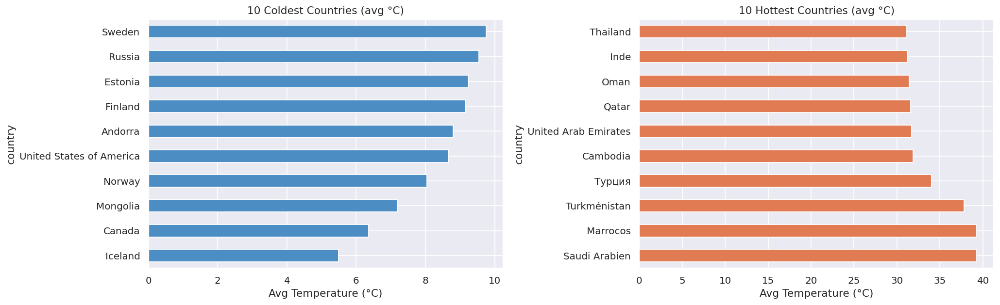

In [13]:
country_temp = df.groupby('country')['temperature_celsius'].mean().sort_values()

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
country_temp.head(10).plot(kind='barh', ax=axes[0], color='#4C8EC4')
axes[0].set_title('10 Coldest Countries (avg °C)', fontsize=12)
country_temp.tail(10).sort_values(ascending=False).plot(kind='barh', ax=axes[1], color='#E07B54')
axes[1].set_title('10 Hottest Countries (avg °C)', fontsize=12)
for ax in axes: ax.set_xlabel('Avg Temperature (°C)')
plt.tight_layout()
plt.savefig('country_temp.png', bbox_inches='tight')
plt.show()


No continent column found — plotting top-15 countries by avg temp instead.


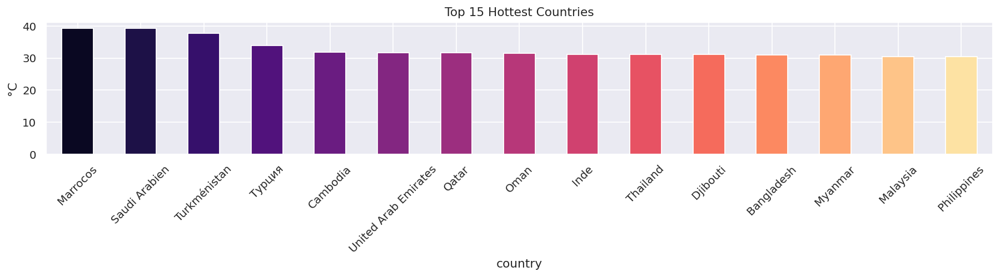

In [14]:
continent_col = next((c for c in ['continent','region'] if c in df.columns), None)

if continent_col:
    pivot = df.groupby([continent_col, 'season'])['temperature_celsius'].mean().unstack()
    pivot.plot(kind='bar', figsize=(14, 5), colormap='tab10')
    plt.title('Average Temperature by Continent & Season', fontsize=13)
    plt.ylabel('°C'); plt.xticks(rotation=30); plt.legend(title='Season')
    plt.tight_layout(); plt.savefig('continent_season.png', bbox_inches='tight'); plt.show()
else:
    print("No continent column found — plotting top-15 countries by avg temp instead.")
    df.groupby('country')['temperature_celsius'].mean().nlargest(15).plot(
        kind='bar', figsize=(14,4), color=sns.color_palette('magma',15))
    plt.title('Top 15 Hottest Countries'); plt.ylabel('°C'); plt.xticks(rotation=45)
    plt.tight_layout(); plt.savefig('top_countries_temp.png', bbox_inches='tight'); plt.show()


In [15]:
geo_cols = [c for c in ['latitude','longitude','lat','lon'] if c in df.columns]
lat_col = next((c for c in ['latitude','lat'] if c in df.columns), None)
lon_col = next((c for c in ['longitude','lon'] if c in df.columns), None)

if lat_col and lon_col:
    geo_df = df.groupby('location_name').agg(
        lat=(lat_col,'first'), lon=(lon_col,'first'),
        temp=('temperature_celsius','mean'),
        humidity=('humidity','mean')
    ).dropna().reset_index()

    fig = px.scatter_geo(geo_df, lat='lat', lon='lon',
                         color='temp', size=np.abs(geo_df['humidity'])+1,
                         hover_name='location_name',
                         color_continuous_scale='RdYlBu_r',
                         title='Global Average Temperature by Location',
                         projection='natural earth')
    fig.update_layout(height=500)
    fig.show()
    fig.write_html('geo_map.html')

else:
    print("No latitude/longitude columns found in dataset.")


Air-quality related columns: ['country', 'condition_text', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'anomaly_consensus']


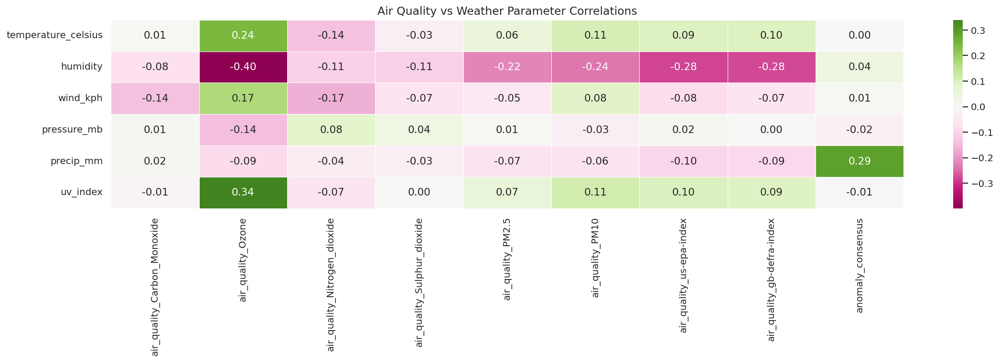

In [18]:
aq_cols = [c for c in df.columns if any(k in c.lower() for k in
           ['air_quality','aqi','pm2','pm10','co','no2','so2','o3','ozone'])]
print("Air-quality related columns:", aq_cols)

if aq_cols:
    weather_aq = core + aq_cols
    numeric_weather_aq = [c for c in weather_aq if c in df.columns and pd.api.types.is_numeric_dtype(df[c])]

    numeric_aq_cols = [c for c in aq_cols if c in df.columns and pd.api.types.is_numeric_dtype(df[c])]

    if numeric_weather_aq and numeric_aq_cols:
        corr_aq = df[numeric_weather_aq].corr()[numeric_aq_cols].drop(index=numeric_aq_cols, errors='ignore')

        plt.figure(figsize=(max(8, len(numeric_aq_cols)*2), 6))
        sns.heatmap(corr_aq, annot=True, fmt='.2f', cmap='PiYG', center=0, linewidths=0.5)
        plt.title('Air Quality vs Weather Parameter Correlations', fontsize=13)
        plt.tight_layout()
        plt.savefig('aq_correlation.png', bbox_inches='tight')
        plt.show()
    else:
        print("No numeric air quality or weather columns found for correlation.")

    aq1 = None
    for col in aq_cols:
        if pd.api.types.is_numeric_dtype(df[col]):
            aq1 = col
            break

    if aq1:
        fig = px.scatter(df.dropna(subset=[aq1,'temperature_celsius']),
                         x='temperature_celsius', y=aq1, color='season' if 'season' in df.columns else None,
                         opacity=0.4, trendline='ols',
                         title=f'{aq1} vs Temperature',
                         labels={'temperature_celsius':'Temp (°C)'})
        fig.show()
    else:
        print("No numeric air quality column found for scatter plot; showing humidity/UV/wind relationships instead.")
        fig = px.scatter_matrix(df[core].dropna(), dimensions=core,
                                color=df['season'] if 'season' in df.columns else None,
                                opacity=0.3, title='Weather Feature Scatter Matrix')
        fig.update_traces(marker_size=2)
        fig.show()
else:
    print("No explicit AQ columns; showing humidity/UV/wind relationships instead.")
    fig = px.scatter_matrix(df[core].dropna(), dimensions=core,
                            color=df['season'] if 'season' in df.columns else None,
                            opacity=0.3, title='Weather Feature Scatter Matrix')
    fig.update_traces(marker_size=2)
    fig.show()


In [19]:
TARGET = 'temperature_celsius'

feat_cols = (['humidity','wind_kph','pressure_mb','precip_mm','uv_index',
              'month','day_of_year','week',
              'temperature_celsius_roll7','temperature_celsius_roll30',
              'temp_lag1','temp_lag3','temp_lag7'])
feat_cols = [c for c in feat_cols if c in df.columns]

model_df = df[feat_cols + [TARGET]].dropna()
X = model_df[feat_cols]
y = model_df[TARGET]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
print(f"Train: {X_train.shape}  |  Test: {X_test.shape}")


Train: (113328, 13)  |  Test: (28333, 13)


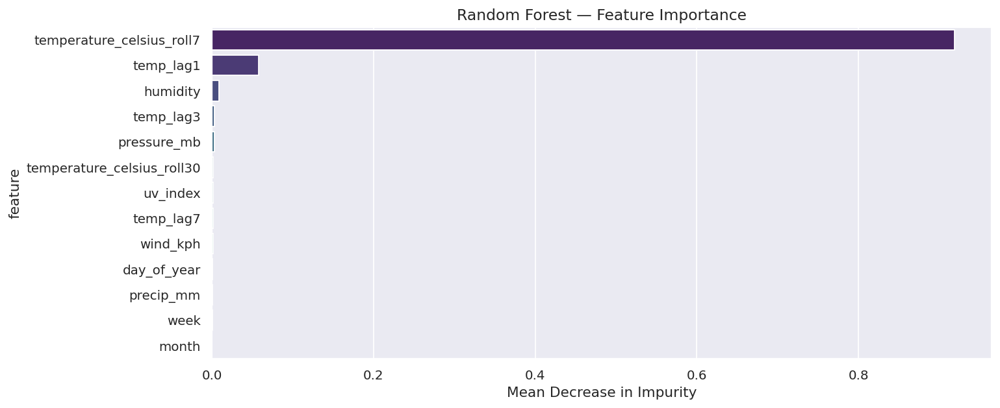

In [20]:
rf = RandomForestRegressor(n_estimators=200, max_depth=12, n_jobs=-1, random_state=42)
rf.fit(X_train, y_train)

imp_df = pd.DataFrame({'feature': feat_cols, 'importance': rf.feature_importances_})
imp_df = imp_df.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 5))
sns.barplot(data=imp_df, x='importance', y='feature', palette='viridis')
plt.title('Random Forest — Feature Importance', fontsize=13)
plt.xlabel('Mean Decrease in Impurity')
plt.tight_layout()
plt.savefig('rf_importance.png', bbox_inches='tight')
plt.show()


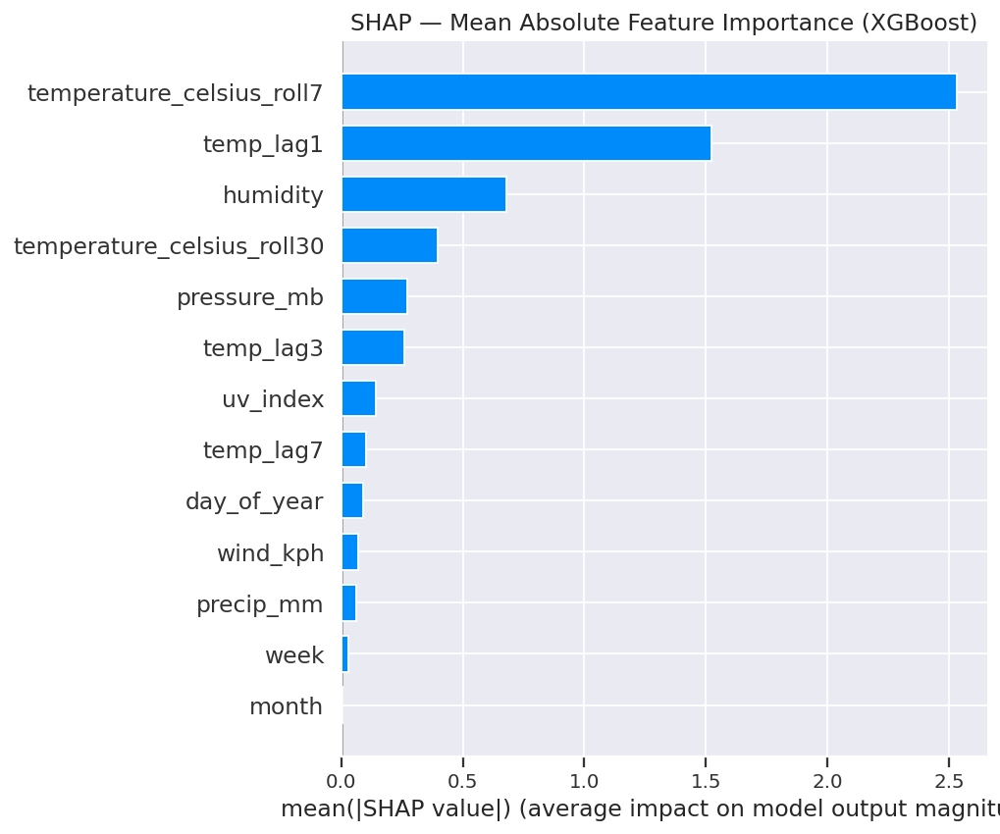

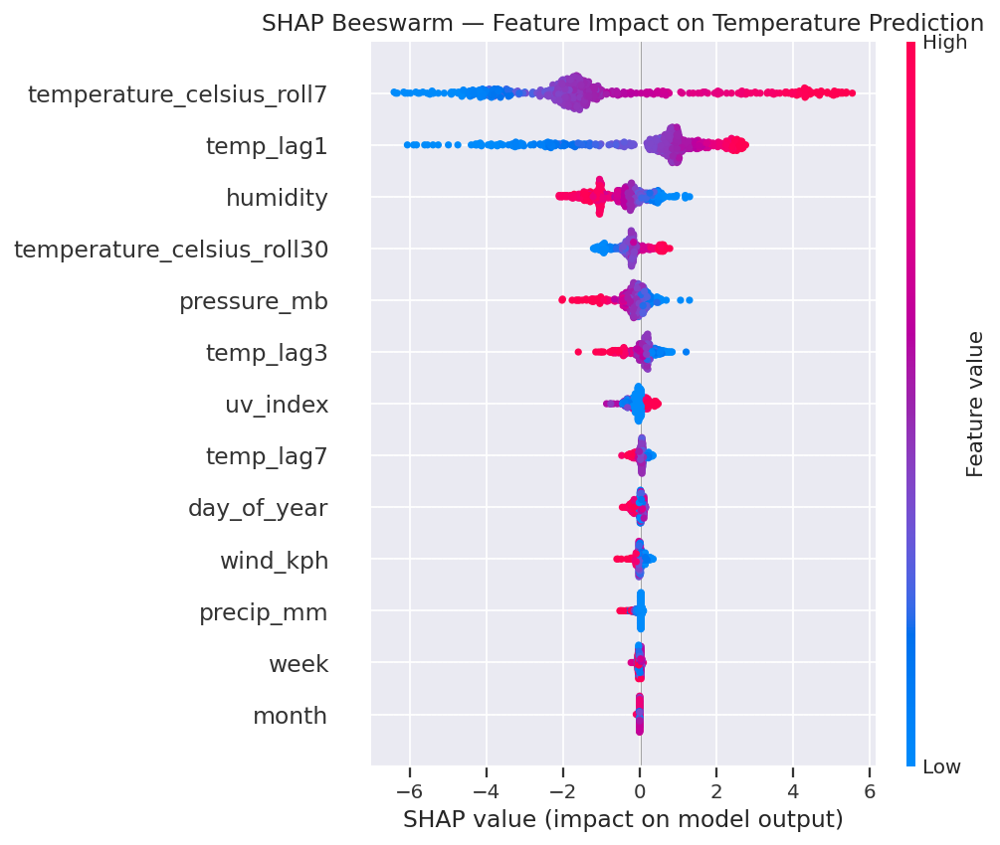

In [21]:
xgb_model = xgb.XGBRegressor(n_estimators=300, max_depth=6, learning_rate=0.05,
                               subsample=0.8, colsample_bytree=0.8,
                               tree_method='hist', random_state=42)
xgb_model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)

explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test.iloc[:500])

plt.figure(figsize=(12, 6))
shap.summary_plot(shap_values, X_test.iloc[:500], plot_type='bar', show=False)
plt.title('SHAP — Mean Absolute Feature Importance (XGBoost)', fontsize=13)
plt.tight_layout()
plt.savefig('shap_importance.png', bbox_inches='tight')
plt.show()

plt.figure(figsize=(12, 6))
shap.summary_plot(shap_values, X_test.iloc[:500], show=False)
plt.title('SHAP Beeswarm — Feature Impact on Temperature Prediction', fontsize=13)
plt.tight_layout()
plt.savefig('shap_beeswarm.png', bbox_inches='tight')
plt.show()


In [22]:
ts = (df.set_index('last_updated')['temperature_celsius']
        .resample('D').mean()
        .interpolate('linear')
        .dropna())

adf_stat, adf_p, *_ = adfuller(ts)
print(f"ADF Statistic: {adf_stat:.4f}  |  p-value: {adf_p:.4f}")
print("Series is", "stationary " if adf_p < 0.05 else "non-stationary (differencing needed)")


ADF Statistic: -1.2369  |  p-value: 0.6575
Series is non-stationary (differencing needed)


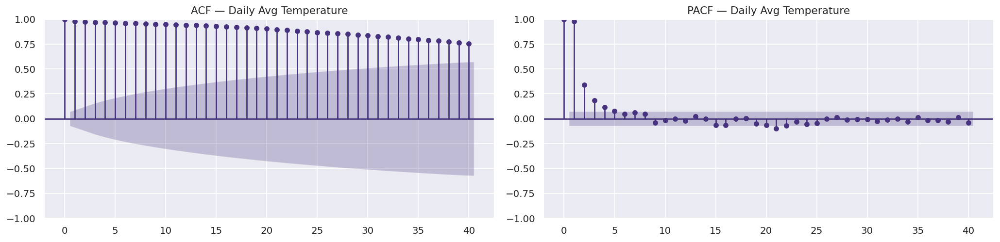

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
plot_acf(ts, lags=40, ax=axes[0], title='ACF — Daily Avg Temperature')
plot_pacf(ts, lags=40, ax=axes[1], title='PACF — Daily Avg Temperature', method='ywm')
plt.tight_layout()
plt.savefig('acf_pacf.png', bbox_inches='tight')
plt.show()


ARIMA  →  MAE: 1.084  RMSE: 1.240  R²: -2.931


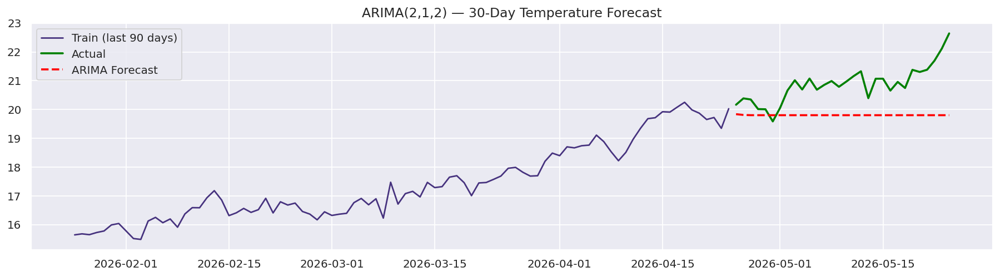

In [24]:
n_test = 30
ts_train, ts_test = ts[:-n_test], ts[-n_test:]

arima = ARIMA(ts_train, order=(2, 1, 2))
arima_fit = arima.fit()
arima_fc  = arima_fit.forecast(steps=n_test)

mae_arima  = mean_absolute_error(ts_test, arima_fc)
rmse_arima = np.sqrt(mean_squared_error(ts_test, arima_fc))
r2_arima   = r2_score(ts_test, arima_fc)
print(f"ARIMA  →  MAE: {mae_arima:.3f}  RMSE: {rmse_arima:.3f}  R²: {r2_arima:.3f}")

plt.figure(figsize=(14, 4))
plt.plot(ts_train[-90:], label='Train (last 90 days)', lw=1.5)
plt.plot(ts_test, label='Actual', color='green', lw=2)
plt.plot(arima_fc, label='ARIMA Forecast', color='red', linestyle='--', lw=2)
plt.title('ARIMA(2,1,2) — 30-Day Temperature Forecast', fontsize=13)
plt.legend(); plt.tight_layout()
plt.savefig('arima_forecast.png', bbox_inches='tight')
plt.show()


Prophet  →  MAE: 0.640  RMSE: 0.746  R²: -0.423


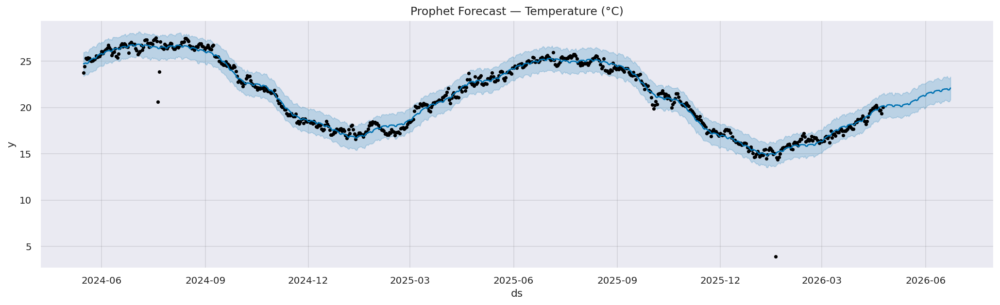

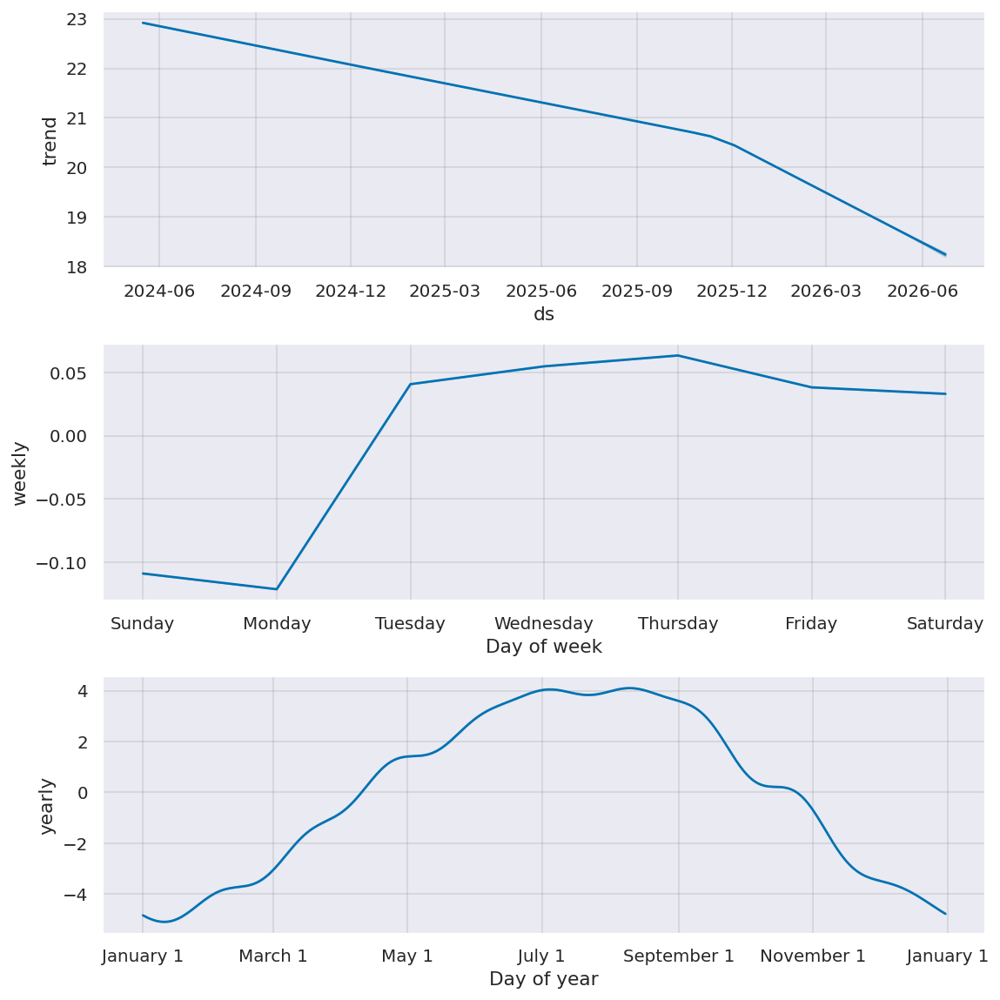

In [25]:
prophet_df = ts.reset_index().rename(columns={'last_updated':'ds','temperature_celsius':'y'})
prophet_train = prophet_df.iloc[:-n_test]
prophet_test  = prophet_df.iloc[-n_test:]

m = Prophet(yearly_seasonality=True, weekly_seasonality=True,
            daily_seasonality=False, interval_width=0.95)
m.fit(prophet_train)

future   = m.make_future_dataframe(periods=n_test + 30)
forecast = m.predict(future)

fc_test  = forecast.set_index('ds')['yhat'].reindex(prophet_test['ds'])
mae_p    = mean_absolute_error(prophet_test['y'], fc_test)
rmse_p   = np.sqrt(mean_squared_error(prophet_test['y'], fc_test))
r2_p     = r2_score(prophet_test['y'], fc_test)
print(f"Prophet  →  MAE: {mae_p:.3f}  RMSE: {rmse_p:.3f}  R²: {r2_p:.3f}")

fig = m.plot(forecast, figsize=(16, 5))
fig.axes[0].set_title('Prophet Forecast — Temperature (°C)', fontsize=13)
plt.tight_layout()
plt.savefig('prophet_forecast.png', bbox_inches='tight')
plt.show()

m.plot_components(forecast)
plt.tight_layout()
plt.savefig('prophet_components.png', bbox_inches='tight')
plt.show()


In [26]:
def evaluate(name, y_true, y_pred):
    mae  = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2   = r2_score(y_true, y_pred)
    print(f"{name:25s}  MAE: {mae:.3f}  RMSE: {rmse:.3f}  R²: {r2:.3f}")
    return {'model': name, 'MAE': mae, 'RMSE': rmse, 'R2': r2}

results = []

y_pred_xgb = xgb_model.predict(X_test)
results.append(evaluate('XGBoost', y_test, y_pred_xgb))

lgb_model = lgb.LGBMRegressor(n_estimators=500, learning_rate=0.03, max_depth=8,
                                num_leaves=63, subsample=0.8,
                                colsample_bytree=0.8, random_state=42, verbose=-1)
lgb_model.fit(X_train, y_train,
              eval_set=[(X_test, y_test)],
              callbacks=[lgb.early_stopping(50, verbose=False)])
y_pred_lgb = lgb_model.predict(X_test)
results.append(evaluate('LightGBM', y_test, y_pred_lgb))

y_pred_rf = rf.predict(X_test)
results.append(evaluate('Random Forest', y_test, y_pred_rf))

gbm = GradientBoostingRegressor(n_estimators=300, max_depth=5, learning_rate=0.05,
                                 subsample=0.8, random_state=42)
gbm.fit(X_train, y_train)
y_pred_gbm = gbm.predict(X_test)
results.append(evaluate('Gradient Boosting', y_test, y_pred_gbm))


XGBoost                    MAE: 1.453  RMSE: 1.982  R²: 0.960
LightGBM                   MAE: 1.431  RMSE: 1.955  R²: 0.961
Random Forest              MAE: 1.490  RMSE: 2.063  R²: 0.957
Gradient Boosting          MAE: 1.489  RMSE: 2.032  R²: 0.958


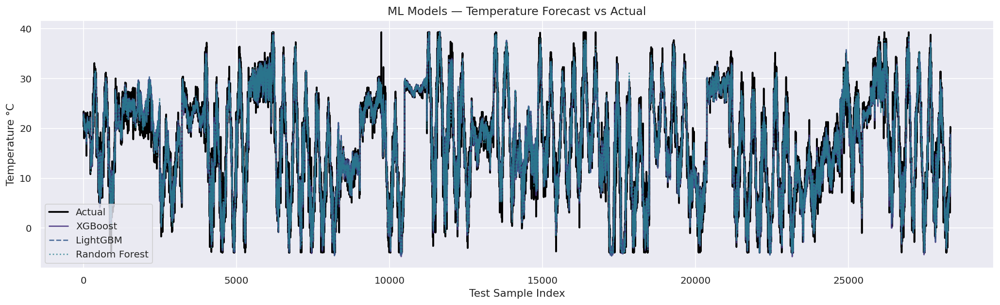

In [27]:
idx = range(len(y_test))
plt.figure(figsize=(16, 5))
plt.plot(y_test.values, label='Actual', color='black', lw=2)
plt.plot(y_pred_xgb, label='XGBoost',          lw=1.5, alpha=0.85)
plt.plot(y_pred_lgb, label='LightGBM',          lw=1.5, alpha=0.85, linestyle='--')
plt.plot(y_pred_rf,  label='Random Forest',      lw=1.5, alpha=0.75, linestyle=':')
plt.title('ML Models — Temperature Forecast vs Actual', fontsize=13)
plt.xlabel('Test Sample Index'); plt.ylabel('Temperature °C')
plt.legend(); plt.tight_layout()
plt.savefig('ml_predictions.png', bbox_inches='tight')
plt.show()


In [28]:
LOOK_BACK = 30
HORIZON   = 7

scaler_dl = StandardScaler()
data_dl   = scaler_dl.fit_transform(model_df[[TARGET] + feat_cols].values)

def make_sequences(arr, look_back, horizon):
    Xs, ys = [], []
    for i in range(len(arr) - look_back - horizon + 1):
        Xs.append(arr[i : i + look_back])
        ys.append(arr[i + look_back : i + look_back + horizon, 0])
    return np.array(Xs), np.array(ys)

X_seq, y_seq = make_sequences(data_dl, LOOK_BACK, HORIZON)
split = int(len(X_seq) * 0.8)
X_tr, X_te = X_seq[:split], X_seq[split:]
y_tr, y_te = y_seq[:split], y_seq[split:]

n_features = X_tr.shape[2]
print(f"DL  |  X_train: {X_tr.shape}  X_test: {X_te.shape}")


DL  |  X_train: (113300, 30, 14)  X_test: (28325, 30, 14)


In [30]:
tf.random.set_seed(42)

lstm_model = Sequential([
    LSTM(128, return_sequences=True, input_shape=(LOOK_BACK, n_features)),
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(HORIZON)
], name='LSTM_Forecaster')

lstm_model.compile(optimizer=tf.keras.optimizers.Adam(1e-3), loss='mse', metrics=['mae'])
lstm_model.summary()

cb = [EarlyStopping(patience=15, restore_best_weights=True),
      ReduceLROnPlateau(patience=7, factor=0.5, verbose=0)]

history_lstm = lstm_model.fit(X_tr, y_tr, validation_split=0.15,
                               epochs=5, batch_size=64, callbacks=cb, verbose=1)


Model: "LSTM_Forecaster"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 30, 128)        │        73,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 30, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 7)              │           231 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,935 (488.03 KB)

 Trainable params: 124,935 (488.03 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 33s 17ms/step - loss: 0.1132 - mae: 0.2380 - val_loss: 0.0796 - val_mae: 0.1899 - learning_rate: 0.0010
Epoch 2/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 31s 10ms/step - loss: 0.0960 - mae: 0.2208 - val_loss: 0.0788 - val_mae: 0.1897 - learning_rate: 0.0010
Epoch 3/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 16s 10ms/step - loss: 0.0915 - mae: 0.2158 - val_loss: 0.0759 - val_mae: 0.1849 - learning_rate: 0.0010
Epoch 4/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - loss: 0.0879 - mae: 0.2120 - val_loss: 0.0771 - val_mae: 0.1889 - learning_rate: 0.0010
Epoch 5/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - loss: 0.0840 - mae: 0.2082 - val_loss: 0.0784 - val_mae: 0.1910 - learning_rate: 0.0010


In [32]:
class PositionalEncodingLayer(Layer):
    def __init__(self, look_back, d_model, **kwargs):
        super().__init__(**kwargs)
        self.look_back = look_back
        self.d_model = d_model
        self.pos_dense = Dense(d_model, name="positional_dense")

    def build(self, input_shape):
        self.pos_encoding_base = tf.range(self.look_back, dtype=tf.float32)[tf.newaxis, :, tf.newaxis]
        super().build(input_shape)

    def call(self, inputs):
        batch_size = tf.shape(inputs)[0]

        tiled_pos_encoding_for_batch = tf.tile(self.pos_encoding_base, [batch_size, 1, 1])
        transformed_pos = self.pos_dense(tiled_pos_encoding_for_batch)

        return inputs + transformed_pos

    def get_config(self):
        config = super().get_config()
        config.update({
            'look_back': self.look_back,
            'd_model': self.d_model,
        })
        return config

def build_transformer(look_back, n_feat, horizon, d_model=64, n_heads=4, ff_dim=128):
    inp = Input(shape=(look_back, n_feat))
    x   = Dense(d_model)(inp)

    x   = PositionalEncodingLayer(look_back, d_model)(x)

    attn_out = MultiHeadAttention(num_heads=n_heads, key_dim=d_model // n_heads)(x, x)
    x        = LayerNormalization()(x + attn_out)
    ff_out   = Dense(ff_dim, activation='relu')(x)
    ff_out   = Dense(d_model)(ff_out)
    x        = LayerNormalization()(x + ff_out)
    x   = GlobalAveragePooling1D()(x)
    x   = Dense(64, activation='relu')(x)
    out = Dense(horizon)(x)
    return Model(inp, out, name='Temporal_Transformer')

transformer = build_transformer(LOOK_BACK, n_features, HORIZON)
transformer.compile(optimizer=tf.keras.optimizers.Adam(5e-4), loss='mse', metrics=['mae'])
transformer.summary()

history_tf = transformer.fit(X_tr, y_tr, validation_split=0.15,
                              epochs=5, batch_size=64, callbacks=cb, verbose=1)


Model: "Temporal_Transformer"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 30, 14)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 30, 64)    │        960 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ positional_encodin… │ (None, 30, 64)    │        128 │ dense_5[0][0]     │
│ (PositionalEncodin… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 30, 64)    │     16,640 │ positional_encod… │
│ (MultiHeadAttentio… │                   │            │ positional_encod… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 30, 64)    │          0 │ positional_encod… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 30, 64)    │        128 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 30, 128)   │      8,320 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 30, 64)    │      8,256 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 30, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 30, 64)    │        128 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 64)        │      4,160 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 7)         │        455 │ dense_8[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 39,175 (153.03 KB)

 Trainable params: 39,175 (153.03 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 30s 16ms/step - loss: 0.1180 - mae: 0.2417 - val_loss: 0.0821 - val_mae: 0.1928 - learning_rate: 5.0000e-04
Epoch 2/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.0972 - mae: 0.2217 - val_loss: 0.0812 - val_mae: 0.1920 - learning_rate: 5.0000e-04
Epoch 3/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 16s 5ms/step - loss: 0.0948 - mae: 0.2189 - val_loss: 0.0808 - val_mae: 0.1930 - learning_rate: 5.0000e-04
Epoch 4/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 0.0933 - mae: 0.2171 - val_loss: 0.0802 - val_mae: 0.1924 - learning_rate: 5.0000e-04
Epoch 5/5
1505/1505 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - loss: 0.0920 - mae: 0.2155 - val_loss: 0.0793 - val_mae: 0.1918 - learning_rate: 5.0000e-04


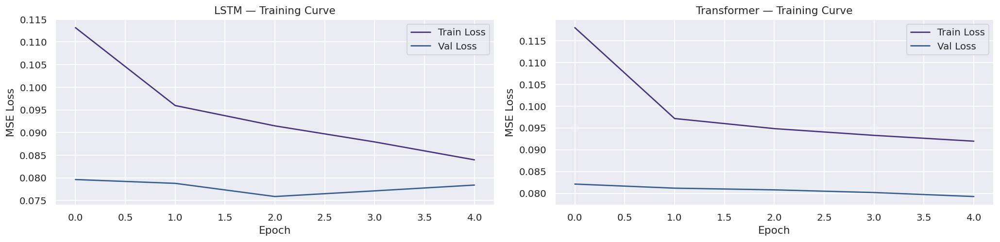

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))
for ax, hist, name in zip(axes,
                           [history_lstm, history_tf],
                           ['LSTM', 'Transformer']):
    ax.plot(hist.history['loss'],     label='Train Loss')
    ax.plot(hist.history['val_loss'], label='Val Loss')
    ax.set_title(f'{name} — Training Curve', fontsize=12)
    ax.set_xlabel('Epoch'); ax.set_ylabel('MSE Loss')
    ax.legend()
plt.tight_layout()
plt.savefig('dl_training_curves.png', bbox_inches='tight')
plt.show()


In [34]:
dummy = np.zeros((len(y_te), data_dl.shape[1]))

def rescale_first(preds):
    dummy_ = np.zeros((len(preds), data_dl.shape[1]))
    dummy_[:, 0] = preds[:, 0]
    return scaler_dl.inverse_transform(dummy_)[:, 0]

def rescale_true(arr):
    dummy_ = np.zeros((len(arr), data_dl.shape[1]))
    dummy_[:, 0] = arr[:, 0]
    return scaler_dl.inverse_transform(dummy_)[:, 0]

y_te_real    = rescale_true(y_te)
y_lstm_real  = rescale_first(lstm_model.predict(X_te, verbose=0))
y_tf_real    = rescale_first(transformer.predict(X_te, verbose=0))

results.append(evaluate('LSTM',        y_te_real, y_lstm_real))
results.append(evaluate('Transformer', y_te_real, y_tf_real))


LSTM                       MAE: 1.830  RMSE: 2.484  R²: 0.937
Transformer                MAE: 1.923  RMSE: 2.610  R²: 0.931


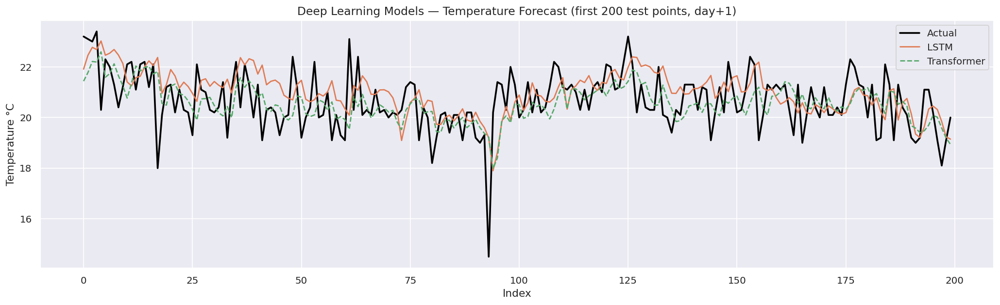

In [35]:
n_plot = 200
plt.figure(figsize=(16, 5))
plt.plot(y_te_real[:n_plot],   label='Actual', color='black', lw=2)
plt.plot(y_lstm_real[:n_plot], label='LSTM',        lw=1.5, color='#E07B54')
plt.plot(y_tf_real[:n_plot],   label='Transformer', lw=1.5, color='#55A868', linestyle='--')
plt.title('Deep Learning Models — Temperature Forecast (first 200 test points, day+1)', fontsize=13)
plt.xlabel('Index'); plt.ylabel('Temperature °C')
plt.legend(); plt.tight_layout()
plt.savefig('dl_predictions.png', bbox_inches='tight')
plt.show()


In [36]:

preds_dict = {'XGBoost': y_pred_xgb,
              'LightGBM': y_pred_lgb,
              'Random Forest': y_pred_rf,
              'Gradient Boosting': y_pred_gbm}

maes = {k: mean_absolute_error(y_test, v) for k, v in preds_dict.items()}
weights = {k: 1 / v for k, v in maes.items()}
total_w = sum(weights.values())
weights = {k: v / total_w for k, v in weights.items()}

ensemble_pred = sum(w * preds_dict[k] for k, w in weights.items())
results.append(evaluate('Ensemble (Weighted)', y_test, ensemble_pred))

print("\nEnsemble weights:")
for k, w in sorted(weights.items(), key=lambda x: -x[1]):
    print(f"  {k:25s}: {w:.4f}")


Ensemble (Weighted)        MAE: 1.446  RMSE: 1.982  R²: 0.960

Ensemble weights:
  LightGBM                 : 0.2560
  XGBoost                  : 0.2522
  Gradient Boosting        : 0.2460
  Random Forest            : 0.2458


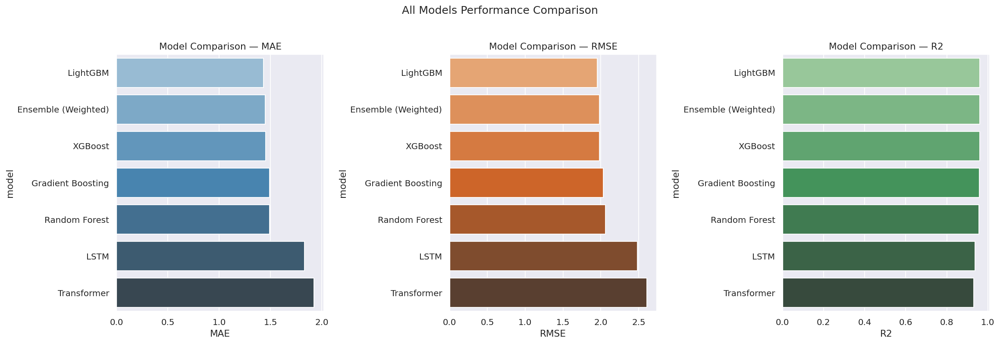


=== FINAL LEADERBOARD ===
              model      MAE     RMSE       R2
           LightGBM 1.431487 1.954577 0.961273
Ensemble (Weighted) 1.445891 1.981568 0.960196
            XGBoost 1.453076 1.982424 0.960162
  Gradient Boosting 1.489366 2.032021 0.958143
      Random Forest 1.490474 2.063376 0.956842
               LSTM 1.830297 2.484405 0.937448
        Transformer 1.923230 2.609936 0.930967


In [37]:
results_df = pd.DataFrame(results).sort_values('RMSE')

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
metrics = ['MAE', 'RMSE', 'R2']
palettes = ['Blues_d', 'Oranges_d', 'Greens_d']

for ax, metric, pal in zip(axes, metrics, palettes):
    asc = (metric != 'R2')
    plot_df = results_df.sort_values(metric, ascending=asc)
    sns.barplot(data=plot_df, x=metric, y='model', palette=pal, ax=ax)
    ax.set_title(f'Model Comparison — {metric}', fontsize=12)
    ax.set_xlabel(metric)
    best = plot_df.iloc[0]['model'] if asc else plot_df.iloc[-1]['model']

plt.suptitle('All Models Performance Comparison', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('model_comparison.png', bbox_inches='tight')
plt.show()

print("\n=== FINAL LEADERBOARD ===")
print(results_df.to_string(index=False))


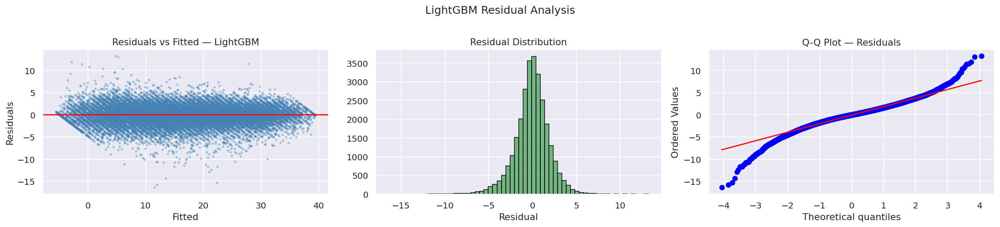

In [38]:
residuals = y_test.values - y_pred_lgb

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].scatter(y_pred_lgb, residuals, alpha=0.3, color='steelblue', s=5)
axes[0].axhline(0, color='red', lw=1.5)
axes[0].set_title('Residuals vs Fitted — LightGBM'); axes[0].set_xlabel('Fitted'); axes[0].set_ylabel('Residuals')

axes[1].hist(residuals, bins=60, color='#55A868', edgecolor='k', alpha=0.8)
axes[1].set_title('Residual Distribution'); axes[1].set_xlabel('Residual')

from scipy import stats
stats.probplot(residuals, dist='norm', plot=axes[2])
axes[2].set_title('Q-Q Plot — Residuals')

plt.suptitle('LightGBM Residual Analysis', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig('residual_analysis.png', bbox_inches='tight')
plt.show()


In [39]:
y_pred_best = lgb_model.predict(X_test)

mae_best = mean_absolute_error(y_test, y_pred_best)
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred_best))
r2_best = r2_score(y_test, y_pred_best)

print(f"Best Model (LightGBM) Performance:")
print(f"MAE: {mae_best:.3f}")
print(f"RMSE: {rmse_best:.3f}")
print(f"R2: {r2_best:.3f}")

Best Model (LightGBM) Performance:
MAE: 1.431
RMSE: 1.955
R2: 0.961
